<a href="https://colab.research.google.com/github/zoetsouroufli/dsp-24-25/blob/main/project_2_dsp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ΨΗΦΙΑΚΗ ΕΠΕΞΕΡΓΑΣΙΑ ΣΗΜΑΤΩΝ      

**2η ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ**


---



###Τσουρούφλη Ζωή - 03122062  
###Ψυχής Μιχάλης - 03122094


---
**Θέμα:** Κωδικοποίηση σημάτων Μουσικής βάσει του
ψυχοακουστικού μοντέλου (Perceptual Audio Coding)


In [ ]:
!pip install sounddevice
!apt install libportaudio2

import os
import math
import wave
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import IPython
import sounddevice as sd
import soundfile as sf
import librosa
import librosa.display
from scipy.io.wavfile import write
from scipy.signal import find_peaks
from IPython.display import Audio
from scipy.signal import stft
from scipy.signal import butter, lfilter
import scipy.signal as sc

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  libportaudio2
0 upgraded, 1 newly installed, 0 to remove and 34 not upgraded.
Need to get 65.3 kB of archives.
After this operation, 223 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudio2 amd64 19.6.0-1.1 [65.3 kB]
Fetched 65.3 kB in 0s (176 kB/s)
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 126102 files and directories currently installed.)
Preparing to unpack .../libportaudio2_19.6.0-1.1_amd64.deb ...
Unpacking libportaudio2:amd64 (19.6.0-1.1) ...
Setting up libportaudio2:amd64 (19.6.0-1.1) ...
Processing triggers for libc-bin (2.35-0ubuntu3.8) ...
/sbin/ldconfig.real: /usr/local/lib/libumf.so.0 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtcm_debug.so.1 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbbin

## Μέρος 1. Ψυχοακουστικό Μοντέλο 1

### Βήμα 1.0: Προεπεξεργασία του σήματος

Στο βήμα αυτό θα πρέπει να επεξεργαστούμε το σήμα κατάλληλα, ώστε να προκύψει το παραθυροποιημένο, κανονικοποιημένο σήμα το οποίο και θα χρησιμοποιήσουμε στη συνέχεια για τη φασματική ανάλυση. Φορτώνουμε αρχικά το σήμα μας με την εντολή sf.read(). Στη συνέχεια, το περνάμε από τη συνάρτηση normalisation, η οποία διαιρεί τα δείγματα του σήματος με την απόλυτη μέγιστη τιμή του.

Έπειτα, αποθηκεύουμε τα δείγματα του παραθυροποιημένου σήματος στην music_wind[] λίστα, τα οποία υπολογίζονται με τη συνάρτηση windowing. Στη συνάρτηση αυτή το σήμα χωρίζεται σε κομμάτια μήκους N=512 , με μηδενικά padding στο τέλος αν χρειάζεται.



In [ ]:
N = 512    # To μήκος των παραθύρων

# Συνάρτηση που παραθυροποιεί το music_norm
def windowing(original, windowed):
  for i in range((len(original)//N) + 1):
    # Έλεγχος για το τελευταίο window. Κάνουμε fill με μηδενικά αν χρείαζεται
    if i == (len(original)//N):
      if len(original)%N == 0: break
      windowed.append(np.pad(original[i*N:], (0, N - len(original[i*N:])), mode='constant'))
    else:
      windowed.append(original[i*N:(i+1)*N])

# Συνάρτηση που κανονικοποιεί ένα σήμα
def normalisation(signal):
  max_val = np.max(np.abs(signal))
  return signal/max_val

# Διαβάζουμε το σήμα
music, music_sr = sf.read('music_dsp.wav')

music_norm = normalisation(music)   # Το κανονικοποιούμε
music_wind = []
windowing(music_norm, music_wind)   # Το παραθυροποιούμε

### Βήμα 1.1: Φασματική Ανάλυση



Αρχικά μας ζητείται ο υπολογισμός της κλίμακας Bark: $b(f) = 13 \arctan(0.00076f) + 3.5 \arctan\left( \left( \frac{f}{7500} \right)^2 \right)$
, η οποία αντιστοιχίζει τις πραγματικές συχνότητες (Hz) σε αντιληπτές για το ανθρώπινο αυτί ζώνες συχνοτήτων. Πρακτικά αυτό που συμβαίνει είναι ότι οι συχνότητες σε Hz περιορίζονται στο πεδίο τιμών [1,25]. Οι χαμηλότερες συχνότητες που είναι ευκολότερα αντιληπτές από το αυτί καταλαμβάνουν περισσότερες μονάδες Bark από τις υψηλές συχνότητες που συμπιέζονται.

In [ ]:
# Συνάρτηση Bark (συχνότητα f σε Hz)
def bark(k, fs=44100, N=512):
  f = k * fs / N
  return (13*math.atan(0.00076*f) + 3.5 * math.atan((f/7500)**2))

Θέλουμε να υπολογίσουμε το P(k) φάσμα ισχύος για Ν=512 δείγματα. Για να το πετύχουμε αυτό ορίζουμε αρχικά το παράθυρο Hanning, με μορφή
$w(n) = \frac{1}{2} \left[1 - \cos\left(\frac{2\pi n}{N - 1} \right) \right]
$ .
Το παράθυρο αυτό το παίρνουμε έτοιμο από τη βιβλιοθήκη της numpy. Εκτελούμε τον μετασχηματισμό Fourier του παραθυροποιημένου-κανονικοποιημένου σήματος music_wind, πολλαπλασιασμένο με το hanning window που φτιάξαμε, αξιοποιώντας τη συνάρτηση fft.fft() της numpy.
Η συνάρτηση αυτή γυρνάει μια λίστα από φάσματα για κάθε παράθυρο άρα είναι της μορφής fft_windowed[window_NUmber][k] .


In [ ]:
hanning = np.hanning(512)  # Δημιουργούμε ένα παράθυρο hanning 512 δειγμάτων
fft_windowed = []

# Πραγματοποούμε τον fft κάθε παραθύρου, πολλαπλασιασμένο με το hanning
for i in range(len(music_wind)):
  fft_windowed.append(np.fft.fft(hanning*music_wind[i]))

# Συνάρτηση Φάσματος Ισχύος N=512 (0 < k < N/2 = 256)
def P(k, window_Number):
  return (90.301 + 10 * math.log10(np.abs(fft_windowed[window_Number][k])**2 + 0.000000000001))

Φτιάχνουμε μια συνάρτηση P(k,window_Number) που υπολογίζει φασματική ισχύ σε dB SPL για κάθε συχνότητα k σε κάθε παράθυρο. Λόγω συμμετρίας κρατάμε k ∈[0,N/2]

Text(0.5, 1.0, 'Φασματική Ανάλυση (Spectrogram)')

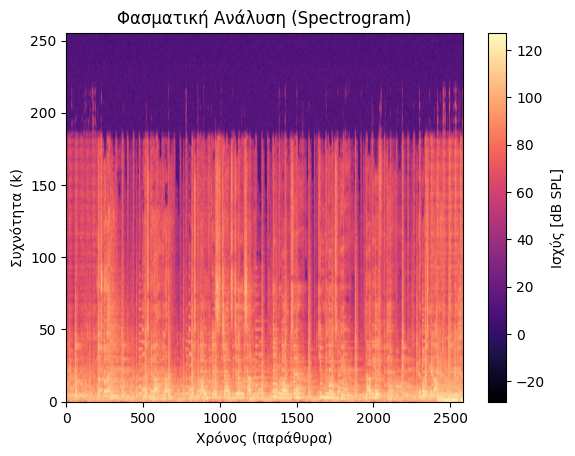

In [ ]:
spectrogram = np.array([[P(k, w) for k in range(256)] for w in range(len(fft_windowed))])
plt.imshow(spectrogram.T, origin='lower', aspect='auto', cmap='magma')
plt.xlabel("Χρόνος (παράθυρα)")
plt.ylabel("Συχνότητα (k)")
plt.colorbar(label='Ισχύς [dB SPL]')
plt.title("Φασματική Ανάλυση (Spectrogram)")

Πλοτάρουμε προαιρετικά και υπολογίζουμε το spectrogram — δηλαδή τη χρονικο-συχνοτική αναπαράσταση του σήματος, άρα υπολογίζουμε τη φασματική ισχύ για κάθε (χρονικό) παράθυρο και κάθε συχνότητα k [0,N/2].
Παρατηρούμε ότι για μικρά k η ισχύς είναι πολύ μεγαλύτερη άρα οι χαμηλές συχνότητες είναι εντονότερες στο σήμα, σε αντίθεση με τις υψηλές. Επίσης οι κάθετες σκοτεινές γραμμές που παρεμβάλλονται φανερώνουν μοτίβα και παλμούς στο μουσικό σήμα.


### Βήμα 1.2: Εντοπισμός μασκών τόνων και θορύβου (Maskers)

Αρχικά, ορίζουμε τη συνάρτηση Δk η οποία εκφράζει πόσο κοντά είναι το επόμενο υψηλότερο φάσμα για να αποφασίσουμε αν σε συγκεκριμένο k το P(k) παρουσιάζει τοπικό μέγιστο ή όχι. Μάλιστα, για μικρά k έχουμε στενότερες μάσκες, ενώ υψηλές συχνότητες έχουμε μεγαλύτερο εύρος. Στις χαμηλές συχνότητες, υπάρχουν πολύ πυκνές ακουστικές πληροφορίες. Επομένως για να οριστεί μια τονική μάσκα, δεν χρειάζεται να έχει μεγάλο εύρος. Αντίθετα στις υψηλές συχνότητες, λόγω της χαμηλής οφέλιμης ακουστικής πυκνότητας, οι τονικές μάσκες πρέπει να έχουν μεγαλύτερο εύρος.

In [ ]:
# Η Συνάρτηση δέλτα
def Delta(k):
  if 2<=k<63:
    return [2]
  if 63<=k<127:
    return [2,3]
  if 127<=k<250:
    return [2,3,4,5,6]
  else: return [404]

Ορίζουμε τη συνάρτηση St(k), η οποία είναι μια δυαδική Boolean συνάρτηση, η οποία επιστρέφει λογικό 0 ή 1, ανάλογα με το αν το φάσμα P(k) (για συγκεκριμένο k), είναι τοπικό μέγιστο (τονική μάσκα) σε σχέση με τους γείτονές του. H tone_mask_positions γυρνάει τις θέσεις k στο φάσμα ενός παραθύρου που υπάρχουν τονικές μάσκες, για κάθε παράθυρο.

In [ ]:
# Η Συνάρτηση St / Επιστρέφει 0 και 1, για false και true αντίστοιχα
def St(k,window_num):
  delta = Delta(k)
  if k<2 or k>=250 or delta[0] == 404:
    return 0
  else:
    Far = True
    Near = (P(k,window_num) >  P(k-1,window_num)) and (P(k,window_num) > P(k+1,window_num))
    if Near == False:
      return 0
    for i in range(len(delta)):
      Far = Far and ((P(k,window_num) > P(k - delta[i],window_num) + 7) and (P(k,window_num) > P(k + delta[i],window_num) + 7))
      if Far == False:
        break
    return int(Far)

# Υπολογίζουμε, χρησιμοποιώντας την St(), τις θέσεις των τονικών μασκών
tone_mask_positions = []
for w in range(len(fft_windowed)):
    masks = [k for k in range(2, 250) if St(k,w) == 1]
    tone_mask_positions.append(masks)

# Τυπώνουμε τις θέσεις, για ένα τυχαίο παράθυρο πχ το 70
print("Θέσεις τονικών μασκών για το παράθυρο 70:", tone_mask_positions[70])

Θέσεις τονικών μασκών για το παράθυρο 70: [4, 8, 31, 108, 120]


Στο σημείο αυτό θέλουμε να υπολογίσουμε την ισχύ της μάσκας P_tm(k) για κάθε k, που παρουσιάζει τοπικό μέγιστο. Υπολογίζουμε δηλαδή, την ενέργεια γύρω από μία τονική μάσκα. Για αυτό και θέλουμε την ισχύ για συχνότητες γύρω από την k, για προκύψει η ολική ενέργεια στην περιοχή αυτή, λόγω συνεχούς φάσματος. Κατασκευάζουμε τη συνάρτηση power()και η ισχύς υπολογίζεται με βάση τη σχέση (7), που μας δινεται για κάθε παράθυρο και δείγμα

$$
\text{PTM}(k) =
\begin{cases}
10 \log_{10}\left(10^{0.1 \cdot P(k-1)} + 10^{0.1 \cdot P(k)} + 10^{0.1 \cdot P(k+1)}\right), & \text{αν } ST(k) = 1 \\
0, & \text{αν } ST(k) = 0
\end{cases}
$$

Αποθηκεύουμε τα αποτελέσματα για κάθε k στη λίστα power_list[ ] και γυρνάμε τελικά τα περιεχόμενα της λίστας αυτής (τελικό αποτέλεσμα).
Στην συνάρτηση όμως δεν μας νοιάζει να υπολογίσουμε την ισχύ για κάθε σημείο αλλά μόνο για αυτά που παρουσιάζουν τοπική μάσκα. Για αυτό δημιουργούμε μία λίστα peaks[ ], στην οποία αποθηκεύουμε μέσα για κάθε παράθυρο το λογικό 0 ή 1 που υπολογίσαμε πορηγουμένως απο την St().




In [ ]:
# Συνάρτηση που ενώνει τα παράθυρα
def join_windows(array):
  return [item for sublist in array for item in sublist]

# Υπολογισμός της Ισχύς της κάθε μάσκας. Εισάγουμε τις μάσκες, και πέρνουμε πίσω έναν πίνακα με τις ισχύς
def power (peaks_list):
  power_list = []
  for window in range(len(peaks_list)):
    power_list.append([])
    for k in range(len(peaks_list[window])):
      if peaks_list[window][k] == 0:
        power = 0
      else:
        power = 10*math.log10(10**(0.1*P(k-1,window)) + 10**(0.1*P(k, window)) + 10**(0.1*P(k+1, window)))
      power_list[window].append(power)
  return power_list

# Φτίαχνουμε έναν πίνακα κορυφών.
peaks = []
num_of_peaks = 0
for i in range(len(music_wind)):
  peaks.append([])
  # Για κάθε παράθυρο, εάν έχουμε τονική μάσκα, τοποθετούμε 1, αλλιώς 0
  for j in range(int(N/2)):
      peaks[i].append(St(j,i)) # (Window_Num, k)
  num_of_peaks += sum(peaks[i])
# Π.χ. peaks[0] = [0 1 0 0 0 0 0 0 1 0 1 ...]

P_TM = power(peaks) # Υπολογίζουμε την ισχύ κάθε τονικής μάσκας
# Π.χ. power[0] = [0 126 0 0 0 0 0 0 154 0 112 ...]
#print(power[70])
#print(peaks[70])
print(f"Total peaks {num_of_peaks} out of {512*len(music_wind)} data points")

Total peaks 11603 out of 1323008 data points


Εφόσον έχουμε υπολογίσει την ισχύ P_TM μετράμε και τον συνολικό αριθμό peaks και τον συγκρίνουμε με τον συνολικό αριθμό δειγμάτων.

### Βήμα 1.3: Μείωση και αναδιοργάνωση των μασκών

Στο βήμα αυτό εφαρμόζουμε τη μείωση και την αναδιοργάνωση των μασκών και συγκρίνουμε με τον εντοπισμό των τοπικών μασκών του προηγούμενου ερωτήματος.
Συχνά χρειάζεται κατά την κωδικοποίηση σημάτων να μειώσουμε τις μάσκες (tonal and noise). Αυτό γιατί από την προηγούμενη διαδικασία προκύπτουν υπερβολικά πολλές μάσκες, πολλές εκ των οποίων είναι ασθενείς σχετικά και δεν συμβάλλουν σημαντικά σε σχέση με γειτονικές.



Προκειμένου να επιλέξουμε ποιες μάσκες θα μειωθούν και ποιες όχι χρησιμοποιούμε δύο βασικά κριτήρια. 1) Κρατάμε τις μάσκες θορύβου που βρίσκονται πάνω από το κατώφλι ακοής (Τq(k), σε περιβάλλον ησυχίας), δηλαδή τις μάσκες
$$
P_{TM,NM}(k) \geq T_q(k)
$$
2) Σε παράθυρα 0.5 Bark (συχνοτική ζώνη) εντοπίζουμε την πιο δυνατή μάσκα και κρατάμε αυτή

In [ ]:
# Συνάρτηση που υπολογίζει το πλήθος των μασκών, χρησιμοποιώντας την ισχύ
def measure_peaks (power_array):
  total_peaks = 0
  for i in range(len(power_array)):
    if power_array[i] > 0:
      total_peaks += 1
  return total_peaks

Θέλουμε να πλοτάρουμε, να κάνουμε υπολογισμούς και συγκρίσεις με τις αρχικές και τις μειωμένες τονικές μάσκες. Αρχικά πλοτάρουμε σε τυχαίο παράθυρο τις αρχικές τονικές μάσκες του παραθύρου αυτού, όπως υπολογίστηκαν στο ερώτημα 1.2.

Έπειτα θέλουμε για το αντίστοιχο τυχαίο παράθυρο να πλοτάρουμε τις τυχαίες τονικές μάσκες. Για να το κάνουμε αυτό φορτώνουμε τον πίνακα με τις μειωμένες τονικές μάσκες που μας δόθηκε και με transpose (.Τ της numpy), τον φέρνουμε στις διαστάσεις και στη μορφή που μας βολεύει. Πλοτάρουμε αντίστοιχα.


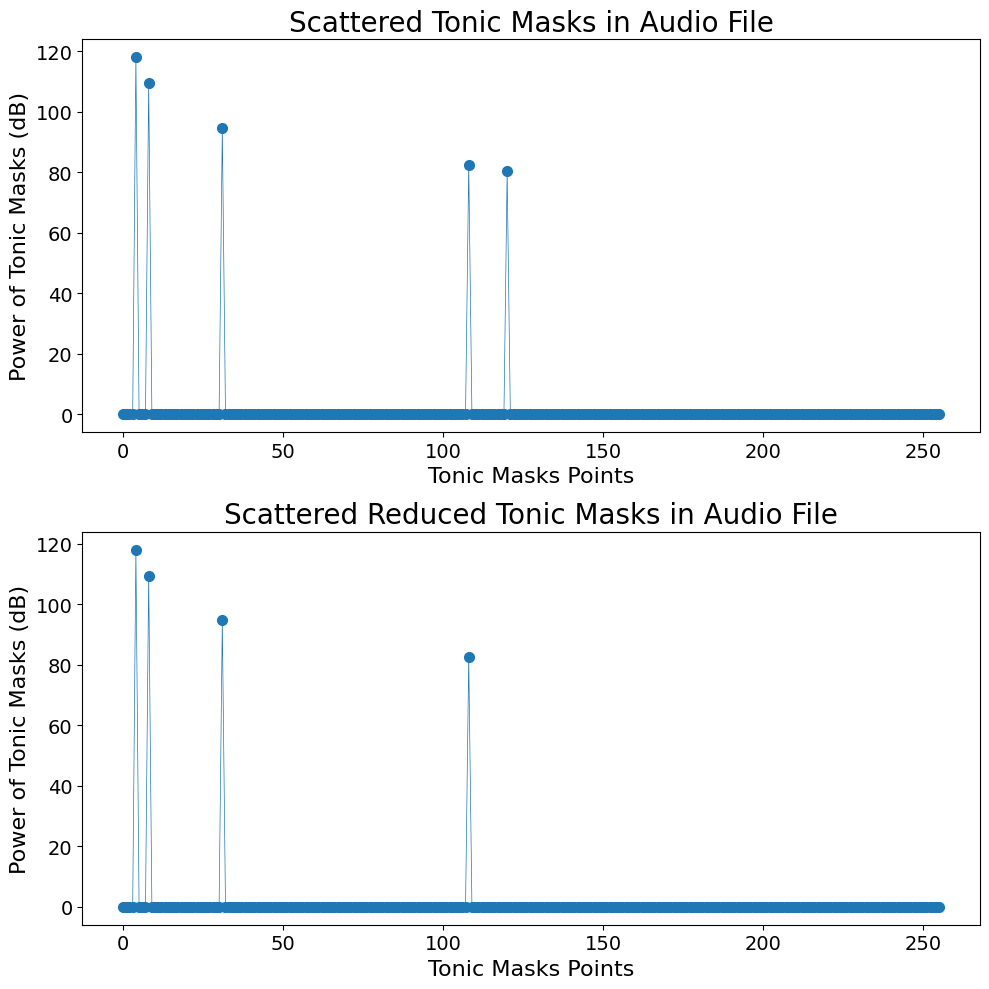

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))  # Adjusted figsize for two plots

# Σχεδίαση των τονικών μασκών
ax1.plot(P_TM[70], marker='o', linewidth=0.5, markersize=7) # Επιλέγουμε τυχαιά 70
ax1.set_title("Scattered Tonic Masks in Audio File", fontsize=20)
ax1.set_ylabel("Power of Tonic Masks (dB)", fontsize=16)
ax1.set_xlabel("Tonic Masks Points", fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)  # Adjust labelsize as needed

# Load and transpose P_TMc
INVERSE_P_TMc = np.load("P_TMc-25.npy")
P_TMc = INVERSE_P_TMc.T

# Σχεδίαση των μειωμένων μασκών
ax2.plot(P_TMc[70], marker='o', linewidth=0.5, markersize=7)
ax2.set_title("Scattered Reduced Tonic Masks in Audio File", fontsize=20)
ax2.set_ylabel("Power of Tonic Masks (dB)", fontsize=16)
ax2.set_xlabel("Tonic Masks Points", fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)  # Adjust labelsize as needed


plt.tight_layout()  # Ensure proper spacing between subplots


Εδώ θέλουμε να συγκρίνουμε τον αριθμό των μασκών και να υπολογίσουμε τη μείωση. Για να μετρήσουμε τον συνολικό αριθμό μασκών αξιοποιούμε τη συνάρτηση join_windows(), η οποία ενώνει όλα τα παράθυρα σε έναν πίνακα και τη συνάρτηση measure_peaks(), η οποία μετράει πόσες τιμές στις λίστες ισχύος μας είναι θετικές και τις προσθέτει καταλήγοντας στον συνολικό αριθμό μασκών κάθε φορά.

In [ ]:
print("------------------------------------------------------")
print(f"Total tonic masks   : {measure_peaks(join_windows(P_TM))}")
print(f"Reduced tonic masks : {measure_peaks(join_windows(P_TMc))}")
print(f"Reduction factor    : {measure_peaks(join_windows(P_TMc))/measure_peaks(join_windows(P_TM))}")


------------------------------------------------------
Total tonic masks   : 11603
Reduced tonic masks : 8657
Reduction factor    : 0.7461001465138326


Παρατηρούμε ότι πράγματι οι μάσκες μειώνονται κατά ένα 30% περίπου. Άλλωστε και από τα διαγράμματα οι τονικές μάσκες φαίνονται μειωμένες. Από γειτονικές μάσκες κρατάμε μόνο τη μεγαλύτερη εκτός αν και οι δύο είναι πολύ έντονες οπότε έχουν σημασία για την πληροφορία του σήματος. Σε κάθε περίπτωση παρατηρούμε ότι η μείωση δεν αλλοιώνει τις πληροφορίες μας.



---

Αντίστοιχη διαδικασία ακολουθούμε και για τις μάσκες θορύβου P_NMc, πλοτάρουμε αρχικές και μειωμένες, αφού πρώτα τις φορτώσουμε και συγκρίνουμε τα αποτελέσματα.

Total noise masks   : 58034
Reduced noise masks : 52012
Reduction factor    : 0.8962332425819347
------------------------------------------------------


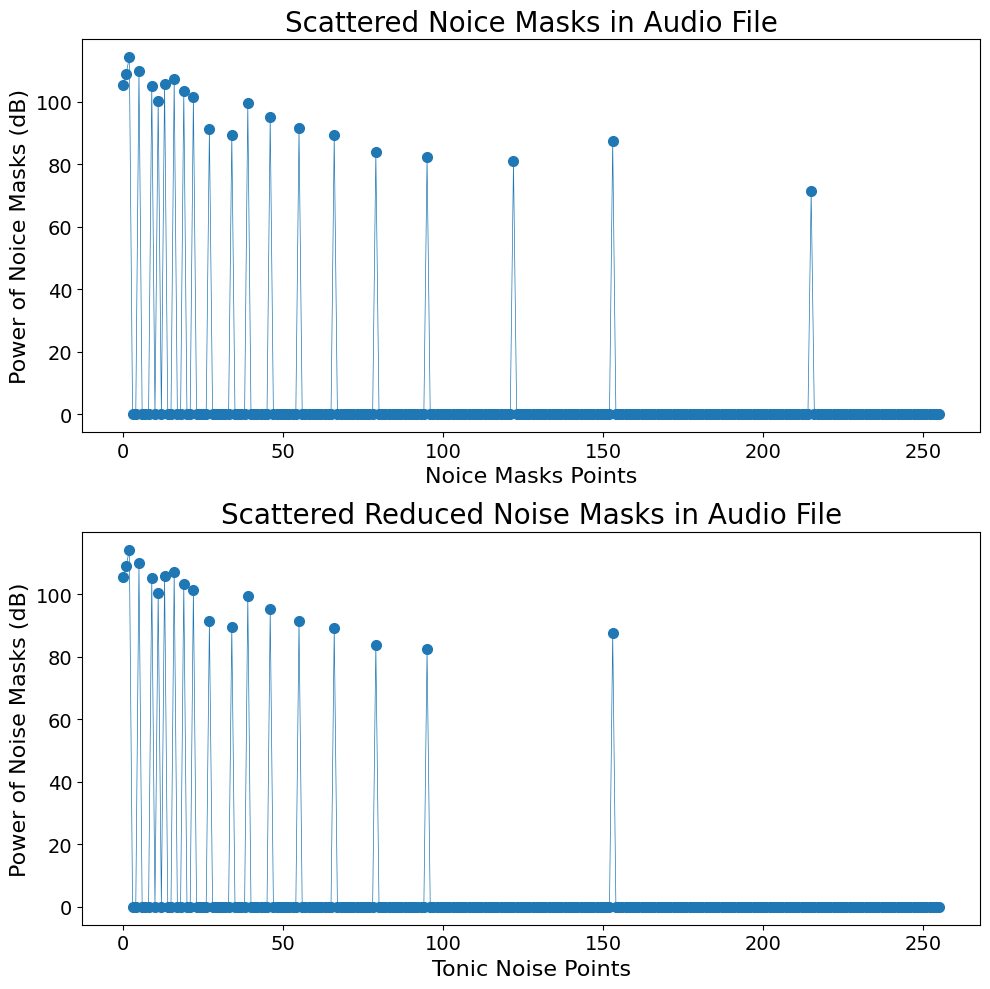

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))  # Adjusted figsize for two plots

# Load and transpose P_ΝM
INVERSE_P_NM = np.load("P_NM-25.npy")
P_NM = INVERSE_P_NM.T

# Σχεδίαση των τονικών μασκών
ax1.plot(P_NM[70], marker='o', linewidth=0.5, markersize=7)
ax1.set_title("Scattered Noice Masks in Audio File", fontsize=20)
ax1.set_ylabel("Power of Noice Masks (dB)", fontsize=16)
ax1.set_xlabel("Noice Masks Points", fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)  # Adjust labelsize as needed

# Load and transpose P_ΝMc
INVERSE_P_NMc = np.load("P_NMc-25.npy")
P_NMc = INVERSE_P_NMc.T

# Σχεδίαση των μειωμένων μασκών
ax2.plot(P_NMc[70], marker='o', linewidth=0.5, markersize=7)
ax2.set_title("Scattered Reduced Noise Masks in Audio File", fontsize=20)
ax2.set_ylabel("Power of Noise Masks (dB)", fontsize=16)
ax2.set_xlabel("Tonic Noise Points", fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)  # Adjust labelsize as needed
plt.tight_layout()  # Ensure proper spacing between subplots

print(f"Total noise masks   : {measure_peaks(join_windows(P_NM))}")
print(f"Reduced noise masks : {measure_peaks(join_windows(P_NMc))}")
print(f"Reduction factor    : {measure_peaks(join_windows(P_NMc))/measure_peaks(join_windows(P_NM))}")
print("------------------------------------------------------")

Και εδώ παρατηρούμε μείωση των μασκών θορύβου αν και μικρότερη γιατί οι μάσκες θορύβου φαίνεται στην πλειοψηφία τους να είναι ισχυρότερες (έχουν μεγαλύτερη ισχύ), οπότε από τα κριτήρια που θέσαμε διατηρούνται. Οι πιο αδύναμες μάσκες ενός παραθύρου παρόλα αυτά εξαφανίζονται.

### Βήμα 1.4: Υπολογισμός των δυο διαφορετικών κατωφλίων κάλυψης (Individual Masking Thresholds)

Στο βήμα αυτό θέλουμε να υπολογίσουμε τα κατώφλια κάλυψης, δηλαδή υπολογίζουμε για κάθε ενεργή μάσκα την επίδραση της σε γειτονικές συχνότητες. Άρα τελικά για κάθε παράθυρο υπολογίζουμε την ισχύ που πρέπει να έχει ο ήχος για να μην καλυφθεί από τις μάσκες.



---
Ξεκινάμε ορίζοντας τις συναρτήσεις που μας δίνονται. Η SF() υπολογίζει την έκταση της κάλυψης στο σημείο i από το σημείο j, στο οποίο βρίσκεται η μάσκα. Εκφράζει δηλαδή πόσο απλώνεται η επίδραση μιας μάσκας από τη θέση j που βρίσκεται σε μία άλλη θέση i του φάσματος και λαμβάνει σαν παραμέτρους την απόσταση από τη μάσκα και το πόσο δυνατή είναι η μάσκα.
Για να ορίσουμε τη συνάρτηση ακολουθούμε τη σχέση που μας δόθηκε:
$$
SF(i,j) =
\begin{cases}
17\Delta_b - 0.4P_{TM}(j) + 11, & -3 \leq \Delta_b < -1 \\
(0.4P_{TM}(j) + 6)\Delta_b, & -1 \leq \Delta_b < 0 \\
-17\Delta_b, & 0 \leq \Delta_b < 1 \\
(0.15P_{TM}(j) - 17)\Delta_b - 0.15P_{TM}(j), & 1 \leq \Delta_b < 8
\end{cases}
$$

με Δb που υπολογίζει σε κλίμακα Bark πόσο μακριά είναι η απόσταση από τη μάσκα. Γενικά για μικρό Δb, προβλέπουμε ισχυρό masking γιατί έχουμε μικρή απόσταση, ενώ όσο το Δb μεγαλώνει γίνεται το masking όλο και πιο αδύναμο.
Η συνάρτηση αυτή γυρνάει μια τιμή σε dB που εκφράζει πόσο θα μειωθεί η επίδραση της μάσκας λόγω της απόστασης της από το σημείο i.

In [ ]:
# Η συνάρτηση SF
def SF(delta_b, P_j):
    if -3 <= delta_b < -1:
        return 17 * delta_b - 0.4 * P_j + 11
    elif -1 <= delta_b < 0:
        return (0.4 * P_j + 6) * delta_b
    elif 0 <= delta_b < 1:
        return -17 * delta_b
    elif 1 <= delta_b < 8:
        return (0.15 * P_j - 17) * delta_b - 0.15 * P_j
    else:
        return 404

Στη συνέχεια ορίζουμε τις συναρτήσεις για τα κατώφλια κάλυψης (masking threshold), για ένα συγκεκριμένο παράθυρο. Οι συνάρτησεις παίρνει ως ορίσματα τη θέση i, j (της μάσκας) και το παράθυρο στο οποίο εργαζόμαστε κάθε φορά και γυρνάνε σαν αποτέλεσμα σε dB το οριακό κατώφλι ήχου για να μην ακούγεται το σημείο i, λόγω κάλυψης του από τη μάσκα στο σημείο j.

Υλοποιούμε τις συναρτήσεις με βάση τις σχέσεις που μας δίνονται:
$$
T_{TM}(i,j) = P_{TM}(j) - 0.275b(j) + SF(i,j) - 6.025 \, (\text{dB SPL})
$$

$$
T_{NM}(i,j) = P_{NM}(j) - 0.175b(j) + SF(i,j) - 2.025 \, (\text{dB SPL})
$$

Για να υπολογιστούν δηλαδή οι συναρτήσεις χρησιμοποιούμε την ισχύ των μασκών που υπολογίσαμε προηγουμένως και το spread factor SF. Αν η SF βγει εκτός ορίων, δεν υπάρχει masking (sf==404: return 0)

In [ ]:
# Η συνάρτηση Ttm
def Ttm (i,j,window):
  delta_b = bark(i) - bark(j)
  sf = SF(delta_b ,P_TM[window][j])
  if sf == 404: return 0
  return P_TM[window][j] - 0.275*bark(j) + sf - 6.025

# Η συνάρτηση Tnm
def Tnm (i,j,window):
  delta_b = bark(i) - bark(j)
  sf = SF(delta_b ,P_NM[window][j])
  if sf == 404: return 0
  return P_NM[window][j] - 0.175*bark(j) + sf - 2.025

Εδώ υλοποιούμε τις μάσκες κατωφλιού για κάθε παράθυρο. Αρχικοποιούμε τις λίστες στις οποίες θα αποθηκεύσουμε τα αποτελέσματα μας (λειτουργούν σαν λεξικό). Φτιάχνουμε δύο λούπες, ώστε να πάρουμε τα masking thresholds για κάθε σημείο, παράθυρο και μάσκα (όπου έχουμε μάσκα τονική και θορύβου αντίστοιχα).

In [ ]:
# Δημιουργία πινάκων Mask threshold
tone_mask_thresh = []
noise_mask_thresh = []

# Δημιουργούμε λεξικά για κάθε παράθυρο.
# Π.χ. tone_mask_thresh[0] = [{9: [1.2 10 .... 9 1], 15: [...], ...}]
# Στο παράθυρο 0, υπάρχουν μάσκες στις θέσεις 9, 15, ... και η κάλυψη φαίνεται στον πίνακα
for i in range(len(fft_windowed)):
  # Για κάθε παράθυρο
  tone_mask_thresh.append({})       # dictionary
  noise_mask_thresh.append({})      # dictionary
  # Για κάθε σημείο των πινάκων τον μασκών
  for j in range(int(N/2)):
    # Εάν έχουμε τονική μάσκα
      if P_TM[i][j] > 0:
        array = []
        # Υπολόγισε την κάλυψη της μάσκας για κάθε σημείο του παραθύρου
        for k in range(int(N/2)):
          array.append(Ttm(k,j,i))
        tone_mask_thresh[i][j] = array
    # Εάν έχουμε μάσκα θορύβου
      if P_NM[i][j] > 0:
        array = []
        # Υπολόγισε την κάλυψη της μάσκας για κάθε σημείο του παραθύρου
        for k in range(int(N/2)):
          array.append(Tnm(k,j,i))
        noise_mask_thresh[i][j] = array

Τώρα θέλουμε να πλοτάρουμε κάποιο ενδεικτικό αποτέλεσμα για να ελέγξουμε τους υπολογισμούς μας. Επιλέγουμε το παράθυρο 70 και την τονική μάσκα 31 και υπολογίζουμε για κάθε θέση i, πόσο καλύπτεται από τη μάσκα για το παράθυρο 70, άρα υπολογίζουμε τα κατώφλια T_TM(i,j) για όλα τα i. Πλοτάρουμε:

Text(0.5, 0, 'Σημεία/Συχνότητες Παραθύρου (k)')

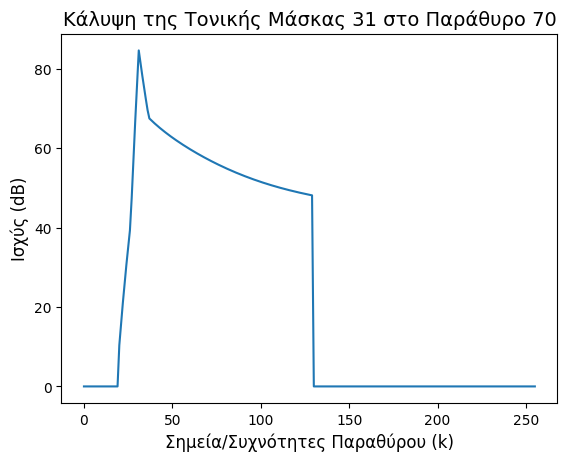

In [ ]:
# Κάλυψη τονικής μάσκας 31, στο παράθυρο 70
window = 70   # Δείκτης παραθύρου
j = 31        # Δείκτης μάσκας (μια κορυφή)
graph = []

# Υπολογισμός T_TM για όλα τα i στην Bark γειτονιά του j
for i in range(0, int(N/2)):
    #delta_b = bark(i) - bark(j)
    #print(f"i={i}, j={j}, Δb={delta_b:.2f}, T_TM={Ttm(i,j,window):.2f} dB SPL")
    graph.append(Ttm(i,j,window))

plt.plot(graph)
plt.title("Κάλυψη της Τονικής Μάσκας 31 στο Παράθυρο 70", fontsize=14)
plt.ylabel("Ισχύς (dB)", fontsize=12)
plt.xlabel("Σημεία/Συχνότητες Παραθύρου (k)", fontsize=12)

Το γράφημα δείχνει πόσο δυνατό πρέπει να είναι το σήμα σε κάθε συχνότητα k, για να ακούγεται παρά το masking. Παρατηρούμε ότι ανάμεσα στο 0-50 το threshold ειναι πάρα πολύ υψηλό κάτι που είναι αναμενόμενο γιατί η μάσκα βρίσκεται στο j=31. Αριστερά της μάσκας φαίνεται πως το threshold κόβεται απότομα, ενώ προς τα δεξιά η τιμή μειώνεται ομαλά. Το αποτέλεσμα αυτό είναι αναμενόμενο γιατί από το psychoacoustic μοντέλο ξέρουμε ότι ο ήχος σε μια συχνότητα καλύπτει καλύτερα συχνότητες ψηλότερες από αυτόν.



### Βήμα 1.5: Υπολογισμός του συνολικού κατωφλίου κάλυψης (Global Masking Threshold)

Εφόσον έχουμε υπολογίσει στα προηγούμενα ερωτήματα ξεχωριστά τις τοπικές μάσκες (τονικές και θορύβου) και το ATH για κάθε συχνότητα i, θα τα συνδυάσουμε όλα αυτά για να πάρουμε ένα τελικό κατώφλι κάλυψης 𝑇𝑔(𝑖),για κάθε συχνότητα i. Το συνολικό κατώφλι κάλυψης εκφράζει πόσο δυνατός πρέπει να είναι ο ήχος σε μία συχνότητα i, για να μπορεί να ακουστεί λαμβάνοντας υπόψη όλα τα masks και το απόλυτο κατώφλι ακοής. Άρα τώρα έχουμε ένα συγκεριμένο threshold ανά συχνότητα και παράθυρο. Για να το ορίσουμε αξιοποιούμε τη σχέση που μας δίνεται:
$$
T_g(i) = 10 \log_{10} \left( 10^{0.1 T_q(i)} + \sum_{l=0}^{255} 10^{0.1 T_{TM}(i, \ell)} + \sum_{m=0}^{255} 10^{0.1 T_{NM}(i, m)} \right) \; \text{dB SPL}
$$




---
Υλοποιούμε πρώτα τη συνάρτηση Tq η οποία εκφράζει το ποσό της ενέργειας σε dB που πρέπει να έχει ένας τόνος, σε μία συχνότητα f, για να γίνεται αντιληπτός σε περιβάλλον ησυχίας. Ακολουθούμε τη σχέση που μασ δίνεται
$$
T_q(f) = 3.64 \left( \frac{f}{1000} \right)^{-0.8} - 6.5e^{-0.6 \left( \frac{f}{1000} - 3.3 \right)^2} + 10^{-3} \left( \frac{f}{1000} \right)^4 \; (\text{dB SPL})
$$


In [ ]:
# Η συνάρτηση Tq()
def Tq(k, fs=44100, N=512):
    f = k * fs / N  # μετατροπή του bin index σε συχνότητα Hz
    fk = f / 1000   # μετατροπή σε kHz
    if k == 0: return 10 ** 2
    return 3.64 * (fk ** -0.8) - 6.5 * math.exp(-0.6 * ((fk - 3.3) ** 2)) + 1e-3 * (fk ** 4)

H συνάρτηση Tg παίρνει ως όρισμα το παράθυρο στο οποίο την υπολογίζουμε κάθε φορά και γυρνάει το συνολικό κατώφλι κάλυψης για κάθε συχνότητα i στο δοθέν παράθυρο. Δημιουργούμε μια λίστα για κάθε συχνότητα i, στην οποία αποθηκεύουμε το Tg για κάθε συχνότητα. Μετατρέπουμε κάθε μάσκα σε γραμμική κλίμακα και στο τέλος ξανά σε dB. Συγκεκριμένα, για κάθε συχνότητα βλέπουμε αν υπάρχει τονική μάσκα και μάσκα θορύβου και αν υπάρχει (ισχύς>0) προσθέτουμε το αντίστοιχο threshold τους.

In [ ]:
# Η συνάρτηση Tg()
def Tg(window):
  mask_sum = []
  for i in range(256):
    mask_sum.append(0)
    for l in range(256):
      if P_TM[window][l] > 0:
        mask_sum[i] += 10 ** (0.1*tone_mask_thresh[window][l][i])
      if P_NM[window][l] > 0:
        mask_sum[i] += 10 ** (0.1*noise_mask_thresh[window][l][i])
    mask_sum[i] += 10**(0.1*Tq(i))
    mask_sum[i] = 10*math.log10(mask_sum[i] + 0.000000000001)
  return mask_sum


Πλοτάρουμε το Συνολικό Κατώφλι Κάλυψης του Παραθύρου 70

Text(0.5, 0, 'Σημεία/Συχνότητες Παραθύρου (k)')

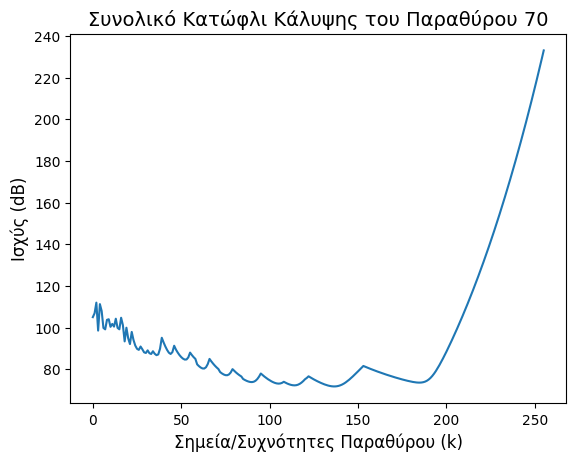

In [ ]:
graph = Tg(70)
plt.plot(graph)
plt.title("Συνολικό Κατώφλι Κάλυψης του Παραθύρου 70", fontsize=14)
plt.ylabel("Ισχύς (dB)", fontsize=12)
plt.xlabel("Σημεία/Συχνότητες Παραθύρου (k)", fontsize=12)

Παρατηρούμε ότι σε υψηλές συχνότητες το threshold είναι πάρα πολύ μεγάλο κάτι το λογικό, αφού σε τέτοιες συχνότητες ο άνθρωπος δεν ακούει έυκολα, άρα το ATH είναι πολύ μεγάλο και επίσης οι μάσκες είναι λιγότερες. Σε μικρότερες τιμές της καμπύλης οι ισχυρές μάσκες που εμφανίζονται εκεί μειώνουν το threshold σημαντικά. Συνολικά πάνω από την καμπύλη είναι το επίπεδο έντασης ήχου που μπορεί να ακουστεί, ενώ κάτω από την καμπύλη ο ήχος είναι masked και δεν ακούγεται.

## Μέρος 2. Χρονο-Συχνοτική Ανάλυση με Συστοιχία Ζωνοπερατών Φίλτρων


### Βήμα 2.0: Συστοιχία Ζωνοπερατών Φίλτρων (Filterbank)

Κάνουμε μια προεργασία για να εκτελέσουμε στη συνέχεια τον MDCT. Αποθηκεύουμε τα δείγματα του σήματος (είσοδος) που θα επεξεργαστούμε στη λίστα music_wind_2[]. Συγκεκριμένα απλά παραθυροποιούμε το αρχικό σήμα για Ν=512, χωρίς να το κανονικοποιήσουμε.

Επίσης ορίζουμε τις κρουστικές αποκρίσεις των φίλτρων που θα χρησιμοποιήσουμε για τα φίλτρα ανάλυσης και σύνθεσης, όπως μας δίνονται στην εκφώνηση. Κατασκευάζουμε Μ=32 διαφορετικά φίλτρα άρα και κρουστικές αποκρίσεις για κάθε φίλτρο, με L=64 δείγματα το καθ΄ένα.
Άρα φτιάχνουμε δύο διπλούς πίνακες h(ανάλυσης) και g(σύνθεσης).

In [ ]:
#παραθυροποιώ το σήμα music για Ν=512 δείγματα (χωρίς normalisation αυτή τη φορά)
music_wind_2=[]
windowing(music, music_wind_2)


M=32   # Αριθμός φίλτρων
L=2*M  # 64, αριθμός δειγμάτων σε κάθε φίλτρο

# ορίζω τις κρουστικές αποκρίσεις (αρχικοποιώ τις διαστάσεις των πινάκων και βάζω μηδενικά)
h_k = np.zeros((M, L))
g_k = np.zeros((M, L))

# Δημιουργούμε τα 32 φίλτρα h_k[n]
for k in range(M):
  for n in range(L):
    sin_w = np.sin((n + 0.5) * (np.pi) / (2 * M))
    h_k[k][n]=sin_w * np.cos((2 * n + 1 + M) *np.sqrt(2 / M)* (2 * k + 1) * (np.pi) / (4 * M))

# Δημιουργούμε τα 32 φίλτρα g_k[n]
for k in range(M):
  for n in range(L):
    g_k[k][n] = h_k[k][L - 1 - n]

# Βλέπουμε τις διαστάσεις των κρουστικών αποκρίσεων
print("h_k(n) shape:", h_k.shape)
print("g_k(n) shape:", g_k.shape)

h_k(n) shape: (32, 64)
g_k(n) shape: (32, 64)


### Βήμα 2.1: Ανάλυση με Συστοιχία Φίλτρων


Υλοποιούμε ανάλυση των φίλτρων με παραθυροποιημένο σήμα.
Στο βήμα αυτό εφαρμόζουμε συνέλιξη για καθ'ένα από τα φίλτρα ανάλυσης που κατασκευάσαμε. Για κάθε φίλτρο λοιπόν (32 στο σύνολο), εφαρμόζουμε συνέλιξη σε κάθε παράθυρο των 512 δειγμάτων του music_wind_2. Για να το πετύχουμε αυτό χρησιμοποιούμε τη συνάρτηση convolve της numpy.

Eπίσης, μετά τη συνέλιξη κάθε φορά κάνουμε decimation (M=32), άρα κράταμε κάθε φορά το πρώτο δείγμα ανά 32 δείγματα. Αυτό το πετυχαίνουμε ξεκινώντας από την αρχή μέχρι το τέλος με step M. Το downsampling εδώ είναι αναγκαίο, για να μειώσουμε το μέγεθος του σήματος και να κρατήσουμε μόνο τη χρήσιμη πληροφορία μετά τη συνέλιξη.

Αποθηκεύουμε τα αποτελέσματα της παραπάνω διαδικασίας στο y_k_output[k][n], με k αριθμός φίλτρου και n το παράθυρο

In [ ]:
# Η παρακάτω συνάρτηση εφαρμόζει το φίλτρο και εκτελεί αποδεκατιμσό (σήμα, κρουστική απόκριση)
def apply_filter_decimation(x,h):
  output=[]
  for i in h:     # για καθε ένα εκ των 32 φίλτρων
    filtered=[]
    for w in x:   # για καθε παράθυρο 512 δειγμάτων
      v_k = np.convolve(w, i)
      y_k = v_k[::M] # Κρατάμε 1 στα Μ δείγματα, δηλαδή εκτελούμε decimation
      filtered.append(y_k)
    output.append(filtered)
  return output

# Λίστα με τα δείγματα του σήματος για κάθε φίλτρο ([ΦΙΛΤΡΑ][ΠΑΡΑΘΥΡΑ][ΔΕΙΜΑΤΑ])
y_k_output = apply_filter_decimation(music_wind_2, h_k)

print("Αριθμός φίλτρων:", len(y_k_output))
print("Αριθμός παραθύρων για κάθε φίλτρο:", len(y_k_output[0]))
print("Μήκος κάθε αποδεκατισμένου παραθύρου:", len(y_k_output[0][0]))

Αριθμός φίλτρων: 32
Αριθμός παραθύρων για κάθε φίλτρο: 2584
Μήκος κάθε αποδεκατισμένου παραθύρου: 18


Παρατηρούμε από τα αποτελέσματα ότι τα στοιχεία έχουν αποθηκευτεί σωστά, αφού έχουμε πράγματι 32 φίλτρα, 2584 δέιγματα τη φορά και το μήκος του πρώτου παραθύρου παρόλο που παρουσιάζεται αυξημένο είναι κάτι που αναμέναμε και θα λάβουμε υπόψη μας στη συνέχεια.

### Βήμα 2.2: Κβαντοποίηση

Για να εκτελέσουμε την κβαντοποίηση, θα πρέπει πρώτα να υπολογίσουμε τον αριθμό των bits που απαιτούνται για να κωδικοποιηθεί κάθε **παράθυρο**. Αυτό το κάνουμε με την συνάρτηση B_k, η οποία έχει ως είσοδο το συνολικό κατώφλι κάλυψης του παραθύρου Tg(), καθώς και τον συντελεστή R. Ο R είναι το πλήθος των βαθμίδων έντασης του αρχικού σήματος και μπορούμε να τον εντοπίσουμε στα metadata του αρχείου wav.

Ουσιαστικά για κάθε παράθυρο εκτελούμε την ίδια διαδικασία:
- Έχουμε φιλτράρει κάθε παράθυρο 32 φορές. Έχουμε δηλαδή χωρίσει το φάσμα σε 32 συνεχόμενα κομμάτια. Το πρώτο φίλτρο απομόνει τις χαμηλότερες συχνότητες κ.ο.κ.
- Υπολογίζουμε το συνολικό κατώφλι κάλυψης που αντιστοιχεί στο κάθε κομμάτι φάσματος και μόνο σε αυτό. Χωρίζουμε λοιπόν και την Tg() σε 32 συνεχόμενα φασματικά παράθυρα.
- Με βάση τους παραπάνω υπολογισμούς, βρίσκουμε τα bits που χρειάζεται κάθε φιλτραρισμένο τμήμα του κάθε παραθύρου για να κωδικοποιηθεί.

In [ ]:
# Η συνάρτηση B_k που υπολογίζει τα Bits για την κβαντοποίηση.
def B_k(Tg_window,R):
  min_Tg=np.min(Tg_window)
  Bk=int(np.log2(R/min_Tg))-1
  return Bk

# Η συνάρτση Tg_bandlimited, ουσιαστικά επιστρέφει την συχνοτική μπάντα κάθε φίλτρου
def Tg_bandlimited(Tg_values,k):
  Tg_values=np.array(Tg_values)
  M=32
  Fs=44100
  f_k = ((2*k-1)* Fs) / (4 * M)
  f_low = f_k - Fs / (4 * M)
  f_high = f_k + Fs / (4 * M)
  freqs = np.linspace(0, Fs / 2, 256)

  mask = np.where((freqs >= f_low) & (freqs <= f_high))
  Tg_band = Tg_values[mask]
  return Tg_band

# Βρίσκουμε τον συντελεστή R
with wave.open("music_dsp.wav", "rb") as wav_file:
    B = wav_file.getsampwidth() * 8
    print(f"Bits ανά δείγμα (R): {B}")
    R=2**(B)

B_k_list=[]
Tg_initial=Tg(w)

# Υπολογίζουμε τα B_k για κάθε φίλτρο και κάθε παράθυρο
for w in range(len(music_wind_2)):
  Tg_initial=Tg(w)

  for k in range(M):
    Tg_use = Tg_bandlimited(Tg_initial,k)
    B_k_list.append(B_k(Tg_use,R))

B_k_array = np.array(B_k_list).reshape(len(music_wind_2), M)  # [παράθυρο][φίλτρο]
print(f"Τα απαιτούμενα Bits για κάθε φίλτρο του παραθύρου 70: {B_k_array[70]}")

Bits ανά δείγμα (R): 16
Τα απαιτούμενα Bits για κάθε φίλτρο του παραθύρου 70: [8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 7 7 7]


Παρακάτω έχουμε σχεδιάσει το διακριτό διάγραμμα των bits που χρειάζεται κάθε φίλτρο για να κωδικοποιηθεί. Παρατηρούμε ότι οι τιμές κυμαίνονται ανάμεσα στα 7 και στα 9 Bits ανά φίλτρο

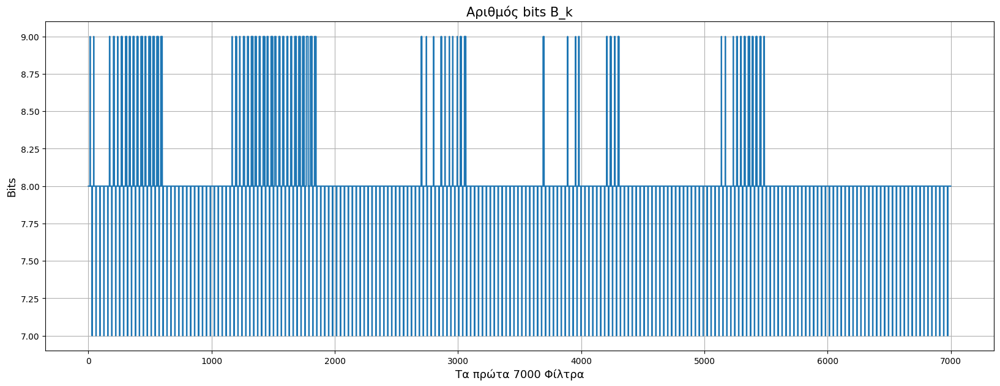

In [ ]:
plt.figure(figsize=(20, 7))
plt.plot(B_k_list[0:7000])
plt.title("Αριθμός bits B_k", fontsize=15)
plt.xlabel("Τα πρώτα 7000 Φίλτρα", fontsize=13)
plt.ylabel("Bits", fontsize=13)
plt.grid()
plt.show()

Τώρα θα υλοποιήσουμε και την συνάρτηση Δ, η οποία θα προσαρμόζει τον κβαντιστή μας ανάλογα και με το εύρος x_max-x_min, δηλαδή την μέγιστη και την ελάχιστη τιμή του αποδεκατισμένου φιλτραρισμένου σήματος. Εάν έχουμε μεγάλο έυρος Δ, δηλαδή η μέγιστη και ελάχιστη τιμή του σήματος απέχουν πολύ μεταξύ τους, τότε θα χρειαστούμε πολλές σταθμες για να εκφράσουμε αυτήν την διαφορά τους.

In [ ]:
Delta_k = []

for w in range(len(music_wind_2)):  # για κάθε παράθυρο
    delta_window = []
    for k in range(M):  # για κάθε από τα 32 φίλτρα
        y_values = y_k_output[k][w]
        xmax = np.max(y_values)
        xmin = np.min(y_values)
        delta = (xmax - xmin) / (2 ** B_k_array[w][k])
        delta_window.append(delta)
    Delta_k.append(delta_window)

Παρακάτω βλέπουμε το βήμα κβαντισμού Δ, για το παράθυρο 70. Παρατηρούμε ότι για χαμηλές συχνότητες (χαμηλά φίλτρα), έχουμε πολύ υψηλό βήμα κβαντισμού. Αυτό είναι αναμενόμενο, καθώς στις χαμηλές συχνότητες, ειδικά σε μουσικά σήματα, έχουμε έντονη συχνοτική δραστηριότητα. Συνοπτικά:
- Sub-Bass: 20–60 Hz
- Bass: 60–250 Hz
- Low-Mid: 250–500 Hz
- Mid: 500 Hz–2 kHz
- Upper-Mid: 2–4 kHz

Είναι λογικό λοιπόν το έυρος Δ να είναι υψηλό για χαμηλές συχνότητες. Αντίθετα στις υψηλές συχνότητες παρατηρούμε μια πιο σταθερή κατάσταση χωρίς απότομες αυξομειώσεις στις ακουστικές συχνότητες και κατά συνέπεια, μικρό βήμα Δ.

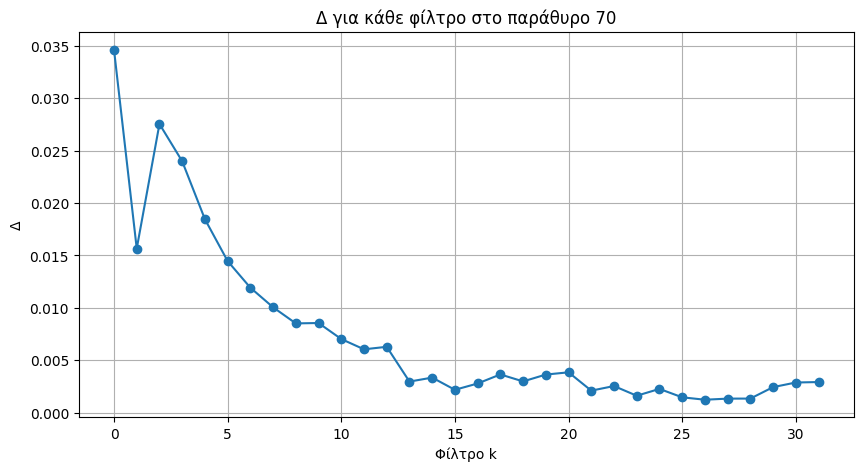

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(Delta_k[70], marker='o')
plt.title("Δ για κάθε φίλτρο στο παράθυρο 70")
plt.xlabel("Φίλτρο k")
plt.ylabel("Δ")
plt.grid(True)
plt.show()

Χρησιμοποιώντας τα παραπάνω εργαλεία/συναρτήσεις, υλοποιούμε τον προσαρμοσμένο κβαντιστή με τον εξής τρόπο: Για κάθε αποδεκατισμένο δείγμα, για κάθε εκ των 32 φίλτρων, κάθε παραθύρου, υπολογίζουμε την σχέση $Q(x) = x \cdot round(x/δ)$. Αυτός είναι ο βασικός τύπος της **ομοιόμορφης κβάντισης**. Ο τρόπος που λειτουργεί είναι ο παρακάτω:
- Κλιμακώνει το σήμα σε μονάδες του δ.
- Στρογγυλοποιεί στο πλησιέστερο ακέραιο.
- Αποκλιμακώνει για να επιστρέψει στην αρχική κλίμακα.

Ουσιαστικά εντοπίζει την πλησιέστερη στάθμη στην τιμή του σήματος. Διαθέτουμε βήματα μεγέθους δ. Χρειαζόμαστε επομένως x/δ επαναλήψεις αυτών των βημάτων για να φτάσουμε στο σημείο x. Όμως μπορούμε να κάνουμε μόνο ακέραιο αριθμό βημάτων. Επομένως η κοντινότερη θέση που μπορούμε να πάμε είναι ο πιο κοντινός ακέραιος αριθμός βημάτων, επί το β. Άρα round(x/δ)*δ.


In [ ]:
# Η συνάρτηση που εφαρμόζει την προσαρμοσμένη κβάντιση
def quantisation(y_k_output, Delta):
    quantised_output = []
    for w in range(len(y_k_output[0])):  # για κάθε παράθυρο
        quantised_window = []
        for k in range(M):  # για κάθε φίλτρο
            delta = Delta[w][k]
            signal = y_k_output[k][w]   # signal[18], περιέχει τις τιμές του εκάστοτε φίλτρου
            quantised = np.round(signal / delta) * delta
            quantised_window.append(quantised)
        quantised_output.append(quantised_window)
    return quantised_output    # shape: [παράθυρο][φίλτρο][δείγματα]

Τυπώνουμε το κβαντισμένο σήμα (Παράθυρο 70 και φίλτρο 0) και βλέπουμε πως ταυτίζεται με το μη κβαντισμένο σήμα.

Αριθμός διαφορετικών τιμών (quantization levels): 1374157
(2584, 512)
(2584, 32, 18)


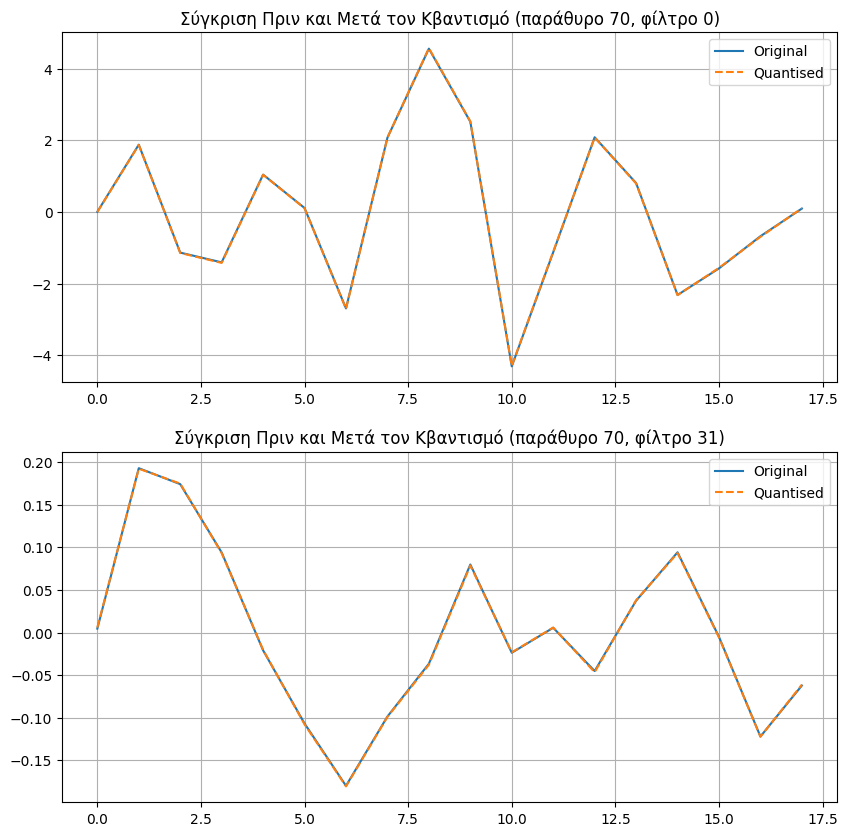

In [ ]:
quantised_adaptive = []
quantised_adaptive = quantisation(y_k_output, Delta_k)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))  # Adjusted figsize for two plots
ax1.plot(y_k_output[0][70], label="Original")
ax1.plot(quantised_adaptive[70][0], label="Quantised", linestyle='--')
ax1.set_title("Σύγκριση Πριν και Μετά τον Κβαντισμό (παράθυρο 70, φίλτρο 0)")
ax1.legend()
ax1.grid(True)

ax2.plot(y_k_output[31][70], label="Original")
ax2.plot(quantised_adaptive[70][31], label="Quantised", linestyle='--')
ax2.set_title("Σύγκριση Πριν και Μετά τον Κβαντισμό (παράθυρο 70, φίλτρο 31)")
ax2.legend()
ax2.grid(True)

unique_levels = np.unique(quantised_adaptive)
print(f"Αριθμός διαφορετικών τιμών (quantization levels): {len(unique_levels)}")
print(np.shape(music_wind_2))
print(np.shape(quantised_adaptive))

Θα εκτελέσουμε την ίδια διαδικασία και για τον μη-προσαρμοζόμενο κβαντιστή. Θα θεωρήσουμε ότι διαθέτουμε 8 bits για την κβάντιση μας. Αξίζει να παρατηρήσουμε πως οι διακριτές στάθμες του μη προσαρμοζόμενου κβαντιστή είναι πολύ λιγότερες από τις διακριτές στάθμες του προσαρμοζόμενου κβαντιστή (231 έναντι 1.374.157). Αυτό συμβαίνει διότι, σε κάθε παράθυρο και σε κάθε φίλτρο αποδίδονται οι ίδιες στάθμες κωδικοποίησης. Έτσι κερδίζουμε μικρότερο μέγεθος δεδομένων και αποθηκευτικές απαιτήσεις αλλά χάνουμε πληροφορίες από το αρχικό μας σήμα.

In [ ]:
#εδώ υλοποιούμε τον μη-προσαρμοζόμενο κβαντιστή
Bk = 8  # σταθερά bits
diff = np.max(y_k_output) - np.min(y_k_output)
delta = diff / (2 ** Bk)
print(f"Δ = {delta}")
Delta = np.full_like(Delta_k, fill_value = delta)
quantised_non_adaptive = quantisation(y_k_output, Delta)
unique_levels = np.unique(quantised_non_adaptive)
print(f"Αριθμός διαφορετικών τιμών (quantization levels): {len(unique_levels)}")

error = y_k_output - np.array(quantised_non_adaptive).transpose(1, 0, 2)
print(f"Μέση απόλυτη διαφορά: {np.mean(np.abs(error)):.6f}")
print(f"Μέσο τετραγωνικό σφάλμα (MSE): {np.mean(error**2):.6f}")

Δ = 0.15832324843631138
Αριθμός διαφορετικών τιμών (quantization levels): 231
Μέση απόλυτη διαφορά: 0.035679
Μέσο τετραγωνικό σφάλμα (MSE): 0.001844


Παρατηρούμε ότι στις χαμηλές συχνότητες (και τις πιο κρίσιμες), υπάρχει πλήρη ταύτιση του μη προσαρμοσμένου κβαντοποιημένου παρθύρου, με το αρχικό. Αντίθετα, στο τελευταίο φίλτρο, δηλαδή στις υψηλές συχνότητες, βλέπουμε ότι η κβαντοποίηση παραμορφώνει το σήμα και το τοποθετεί σε εσφαλμένες κβαντικές στάθμες.

Για να καταλάβουμε καλύτερα γιατί ο μη προσαρμοζόμενος κβαντιστής παρουσιάζει αυτήν την συμπεριφορά, πρέπει να μελετήσουμε το Δ, δηλαδή το βήμα κβαντισμού. Βλέπουμε πως η σταθερή τιμή του Δ που χρησιμοποιούμε στον μη προσαρμοζόμενο κβαντιστή είναι πολύ υψηλή.

Εάν δούμε το εύρος Δ που χρησιμοποιήσαμε στον προσαρμοζόμενο κβαντιστή, θα παρατηρήσουμε ότι τα φίλτρα όσο η τιμή k αρχίζει να αυξάνεται αρχίζουν να απαιτούν ολοένα και μικρότερο βήμα κβαντισμού. Όσο μεγαλώνει η τιμή k του φίλτρου, δηλαδή όσο κοιτάμε φάσματικό παράθυρο υψηλότερων συχνοτήτων, η τιμή του Δ μειώνεται δραματικά σε τιμές της τάξης του 0,001.

Στα χαμηλά φίλτρα, όπου οι τιμές του σήματος είναι μεγάλες και ευθυγραμμίζονται σχεδόν πάντα πάνω σε ακέραια πολλαπλάσια αυτού του Δ, η κβάντωση είναι ικανοποιητική.

Στα ψηλά φίλτρα, όμως, όπου το σήμα κινείται σε πολύ στενό εύρος γύρω από το 0, το ίδιο Δ είναι πολύ χοντρό σε σχέση με την πραγματική διακύμανση. Οπότε κάθε δείγμα κόβετε/στρογγυλοποιείται με αποτέλεσμα τα κβαντοποιημένα επίπεδα να μην συμπίπτουν με τις πραγματικές τιμές του φάσματος.

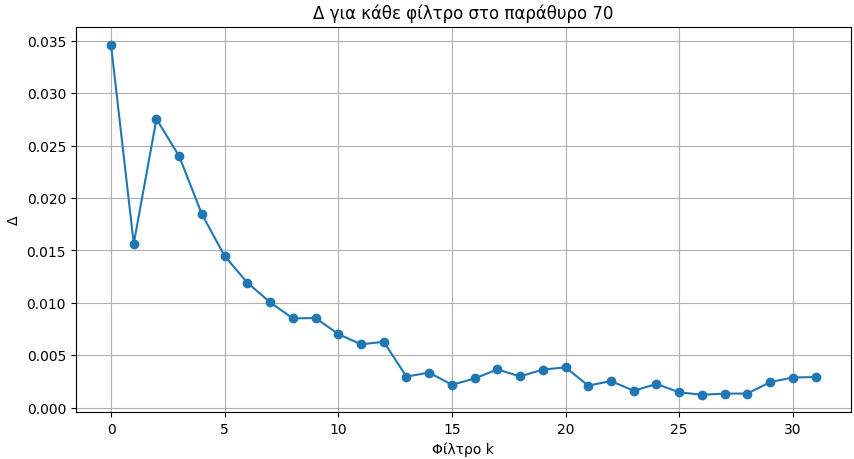

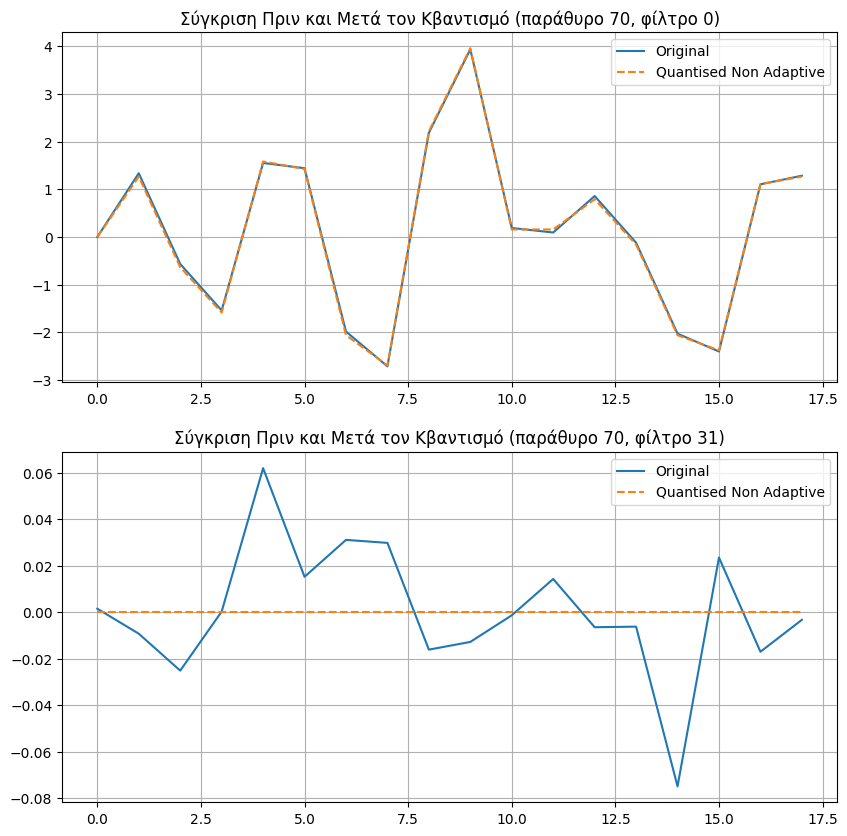

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))  # Adjusted figsize for two plots

ax1.plot(y_k_output[0][90], label="Original")
ax1.plot(quantised_non_adaptive[90][0], label = "Quantised Non Adaptive", linestyle='--')
ax1.set_title("Σύγκριση Πριν και Μετά τον Κβαντισμό (παράθυρο 70, φίλτρο 0)")
ax1.legend()
ax1.grid(True)

ax2.plot(y_k_output[31][80], label="Original")
ax2.plot(quantised_non_adaptive[80][31], label = "Quantised Non Adaptive", linestyle='--')
ax2.set_title("Σύγκριση Πριν και Μετά τον Κβαντισμό (παράθυρο 70, φίλτρο 31)")
ax2.legend()
ax2.grid(True)

Είναι χρήσιμο να δούμε και την αποτελεσματικότητα της συμπίεσης κάθε κβαντιστή. Υπολογίζουμε το ποσοστό συμπίεση για τον προσαρμοζόμενο και μη κβαντιστή. Βλέπουμε τα εξής αποτελέσματα:

    Μη-προσαρμοζόμενος  ->  Ποσοστό συμπίεσης : 0.50000
    Προσαρμοζόμενος     ->  Ποσοστό συμπίεσης : 0.43731

Είναι αναμενόμενο ο μη προσαρμοζόμενος κβαντιστής να καταφέρνει μεγαλύτερη συμπίεση, εις βάρος της χαμηλότερης ηχητικής ποιότητας. Αντίθετα, ο μη προσαρμοζόμενος, ενώ διατηρεί ένα υψηλό επίπεδο ηχητικής ποιότητας, καταφέρνει συμπίεση ίση με το 86% της συμπίεσης του μη προσαρμοζόμενου.

In [ ]:
# δεδομενα
B_initial = 16  # bits ανά δείγμα
N_samples = len(music)  # συνολικός αριθμός δειγμάτων
bits_initial = N_samples * B_initial

#ποσοστο συμπίεσης για μη προσαρμοζομενο κβαντιστη
B_k = 8  # bits ανά δείγμα ειναι fixed
bits_final_fixed = N_samples * B_k
compression_rate_fixed = 1 - (bits_final_fixed / bits_initial)

#ποσοστο συμπίεσης για προσαρμοζομενο κβαντιστη
bits_final_adaptive = 0
for w in range(len(music_wind_2)):  # windows
    for k in range(32):  # filters
        B_k = B_k_array[w][k]
        num_samples = len(y_k_output[k][w])
        bits_final_adaptive += B_k * num_samples

compression_rate_adaptive = 1 - (bits_final_adaptive / bits_initial)

#αποτελεσματα
print("Αποτελέσματα Συμπίεσης:\n")

print("Μέθοδος: Μη-προσαρμοζόμενος")
print(f"  Bits αρχικό       : {bits_initial}")
print(f"  Bits τελικό       : {bits_final_fixed}")
print(f"  Ποσοστό συμπίεσης : {compression_rate_fixed:.5f}\n")

print("Μέθοδος: Προσαρμοζόμενος")
print(f"  Bits αρχικό       : {bits_initial}")
print(f"  Bits τελικό       : {bits_final_adaptive}")
print(f"  Ποσοστό συμπίεσης : {compression_rate_adaptive:.5f}")

Αποτελέσματα Συμπίεσης:

Μέθοδος: Μη-προσαρμοζόμενος
  Bits αρχικό       : 21168000
  Bits τελικό       : 10584000
  Ποσοστό συμπίεσης : 0.50000

Μέθοδος: Προσαρμοζόμενος
  Bits αρχικό       : 21168000
  Bits τελικό       : 11910942
  Ποσοστό συμπίεσης : 0.43731


### Βήμα 2.3: Σύνθεση




Η συνάρτηση upsample, παρεμβάλλει με M μηδενικά και υπερδειγματοληπτεί κάθε αποδεκατισμένο φιλτραρισμένο υποσήμα.

In [ ]:
# Συνάρτηση upsample
def upsample(signal, M):
    upsampled = np.zeros(len(signal) * M)
    upsampled[::M] = signal
    return upsampled

Η συνάρτηση ανακατασκευής του τελικού σήματος λειτουργεί σε δύο μέρη.Το πρώτο κομμάτι της διαδικασίας αυτής, το αναλαμβάνει η συνάρτηση filter_addition. Ουσιαστικά αυτή η συνάρτηση λαμβάνει κάθε σετ 32 φιλτραρισμένων σημάτων και κάνει την ανασύνθεση του παραθύρου. Αρχικά φιλτράρει κάθε υποσήμα με ένα εκ των 32 νέων φίλτρων g_k που δημιουργήσαμε στο μέρος 2.0. Στην συνέχεια προσθέτει μεταξύ τους και τα 32 νέα φιλτραρισμένα σήματα και δημιουργεί ένα ενιαίο σήμα, που αντιστοιχεί στο νέο παράθυρο. Τα νέα φιλτραρισμένα σήματα αλλά και το τελικό σήμα παραθύρου, λόγω των δυό συνελίξεων, έχουν μήκος 639 δείγματα (127 περισσότερα από τα αρχικά 512).

Επαναλαμβάνουμε την παραπάνω διαδικασία για κάθε παράθυρο και καταλήγουμε με όλα τα παράθυρα να έχουν μήκος 639 δειγμάτων. Στο δεύτερο μέρος της ανακατασκευής, πρέπει να διατάξουμε τα παράθυρα στην σειρά για να δημιουργήσουμε το τελικό ηχητικό σήμα. Για αυτήν την διαδικασία θα χρησιμοποιήσουμε την συνάρτηση OLA. Η OLA, πραγματοποιεί επικάλυψη και άθροιση των παραθύρων στο πεδίο του χρόνου. Συγκεκριμένα, κάθε παράθυρο τοποθετείται στη σωστή χρονική θέση σύμφωνα με το βήμα μετατόπισης (hop size), και τα επικαλυπτόμενα τμήματα των παραθύρων αθροίζονται σημείο προς σημείο. Με αυτόν τον τρόπο, επιτυγχάνεται η συνένωση όλων των επεξεργασμένων παραθύρων σε ένα συνεχές σήμα. Εμείς έχουμε Hop Size 512 δειγμάτων. Περνάμε στην συνάρτηση OLA και τον αριθμό των παραπάνω δειγμάτων των νέων παραθύρων (127), με την μεταβλητή area.

In [ ]:
# Η συνάρτηση Overlap Add. Area: τα παραπάνω δείγματα των convoluted σημάτων.
def OLA(blocks, area):
  overlapped_wind = []
  final_len = len(blocks[0]) - area
  overlapped_wind.append(blocks[0][int(area/2):final_len])
  for k in range(len(blocks)-1):
    overlapped_wind.append(np.array(blocks[k][final_len:]) + np.array(blocks[k+1][0:area]))
    overlapped_wind.append(blocks[k+1][area:final_len])
  overlapped_wind.append(blocks[k+1][final_len:final_len + int(area/2)])
  return np.concatenate(overlapped_wind)

# Η filter_addition, κάνει upsample, filter με g και προσθέτει τα 32 φιλτραρισμένα σήματα μεταξύ τους.
def filter_addition(window_filters, g_filters):
  time_domain_filtered_signals = np.zeros(639)   # Τα 32 φιλτραρισμένα σήματα
  for k in range(M):
    upsampled = upsample(window_filters[k], M)
    filtered = np.convolve(upsampled, g_filters[k], mode='full')
    time_domain_filtered_signals += filtered
  return time_domain_filtered_signals

In [ ]:
recon_signal_adaptive = []
recon_signal_non_adaptive = []

for i in range(len(quantised_adaptive)):
  recon_signal_adaptive.append(filter_addition(quantised_adaptive[i], g_k))
  recon_signal_non_adaptive.append(filter_addition(quantised_non_adaptive[i], g_k))

recon_signal_adaptive = OLA(recon_signal_adaptive, 127)
recon_signal_non_adaptive = OLA(recon_signal_non_adaptive, 127)

Σχεδιάζουμε τα πρώτα 4000 δείγματα των Ανακατασκευασμένων σημάτων και τα συγκρίνουμε με το αρχικό σήμα. Βλέπουμε με μεγάλη έκπληξη πως και το προσαρμοζόμενο αλλά και το μη προσαρμοζόμενο σήμα ταυτίζονται σχεδόν πλήρως με το αρχικό. Το μη προσαρμοζόμενο σήμα έχει μια πολύ μικρή διαφορά σε σχέση με το αρχικό, κυρίως στο υψομετρικό εύρος των κορυφών. Βέβαια όπως θα ακούσουμε παρακάτω, το μη προσαρμοζόμενο σήμα ακουστικά είναι υποδεέστερο του προσαρμοζόμενου. Οι διαφορές είναι δύκολο να αποτυπωθούν οπτικά και επίσης δεν μπορούμε να έχουμε εικόνα για το πλήρες ηχητικό σήμα.

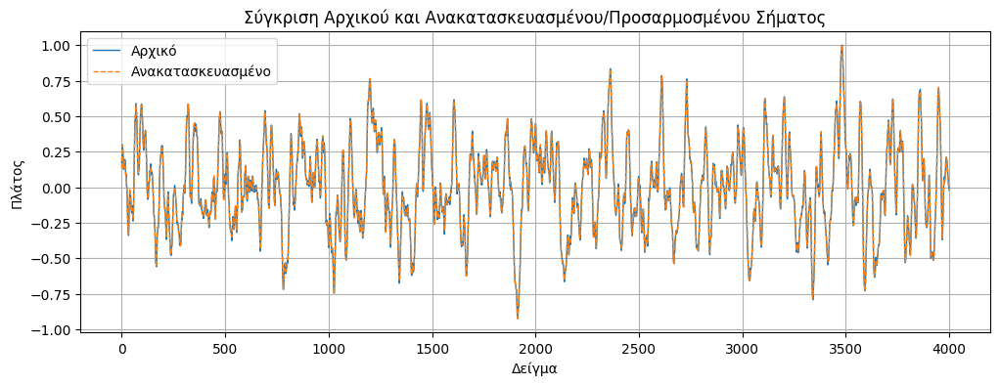

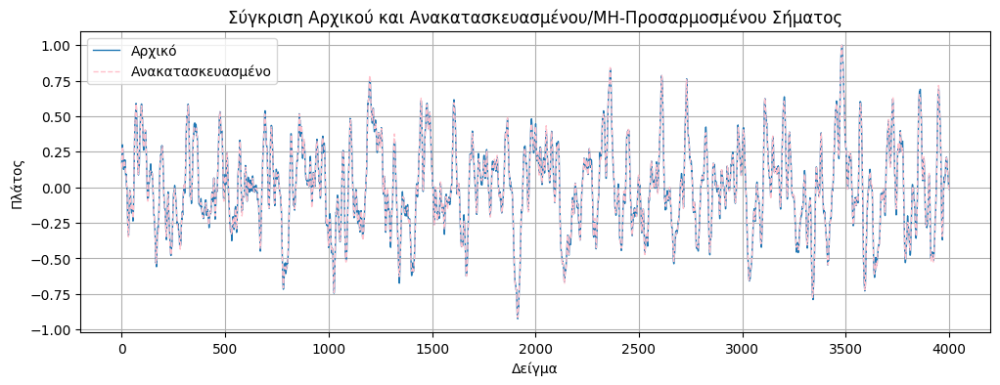

In [ ]:
# Συγκρίνουμε τα πρώτα 4000 δείγματα για ευκρίνεια
samples_to_plot = 4000
plt.figure(figsize=(12, 4))
plt.plot(normalisation(music[:samples_to_plot]), label="Αρχικό", linewidth=1)
plt.plot(normalisation(recon_signal_adaptive[:samples_to_plot]), label="Ανακατασκευασμένο", linestyle='--', linewidth=1)
plt.title("Σύγκριση Αρχικού και Ανακατασκευασμένου/Προσαρμοσμένου Σήματος")
plt.xlabel("Δείγμα")
plt.ylabel("Πλάτος")
plt.legend()
plt.grid(True)
plt.show()

# Συγκρίνουμε και το μη προσαρμοσμένο Σήμα
plt.figure(figsize=(12, 4))
plt.plot(normalisation(music[:samples_to_plot]), label="Αρχικό", linewidth=1)
plt.plot(normalisation(recon_signal_non_adaptive[:samples_to_plot]), label="Ανακατασκευασμένο", color = "pink", linestyle='--', linewidth=1)
plt.title("Σύγκριση Αρχικού και Ανακατασκευασμένου/ΜΗ-Προσαρμοσμένου Σήματος")
plt.xlabel("Δείγμα")
plt.ylabel("Πλάτος")
plt.legend()
plt.grid(True)
plt.show()

Σχεδιάζουμε και το μέγεθος του σφάλματος μεταξύ των ανακατασκευασμένων και του αρχικού σήματος. Βλέπουμε ότι σε κάποια σημεία υπάρχει σφάλμα στην ανακατασκευή αλλά γενικότερα το σφάλμα είναι χαμηλό. Επίσης τα σφάλματα του προσαρμοζόμενου και του μη προσαρμοζόμενου είναι παρόμοια.

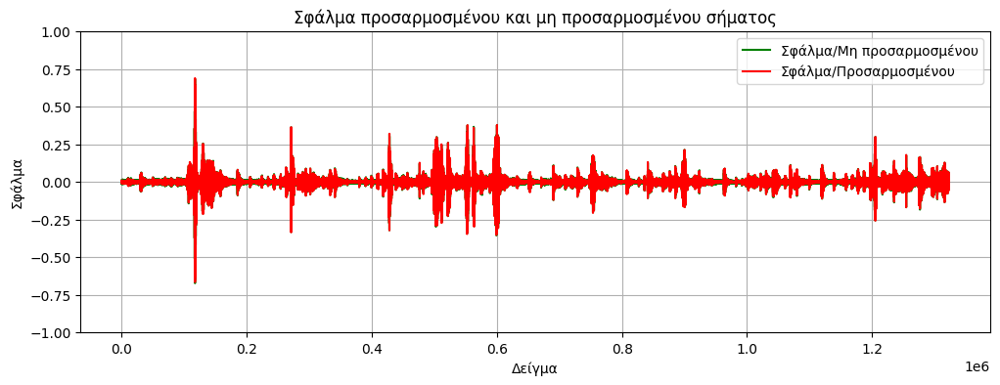

In [ ]:
# Πλοτ σφάλματος
error_adaptive = normalisation(music) - normalisation(recon_signal_adaptive[:len(music)])
error_non_adaptive = normalisation(music) - normalisation(recon_signal_non_adaptive[:len(music)])
plt.figure(figsize=(12, 4))
plt.ylim(-1,1)
plt.plot(error_non_adaptive, label="Σφάλμα/Μη προσαρμοσμένου", color="green")
plt.plot(error_adaptive, label="Σφάλμα/Προσαρμοσμένου", color="red")
plt.title("Σφάλμα προσαρμοσμένου και μη προσαρμοσμένου σήματος")
plt.xlabel("Δείγμα")
plt.ylabel("Σφάλμα")
plt.legend()
plt.grid(True)
plt.show()

Παρακάτω ακούμε τα ηχητικά σήματα. Αρχικά ακούμε το αυθεντικό. Στην συνέχεια τα δύο ανακατασκευασμένα, το προσαρμοζόμενο και το μη προσαρμοζόμενο. Παρατηρούμε πως και στα δύο ανακατασκευασμένα υπάρχει μια πτώση της ποιότητας, χωρίς όμως να είναι μεγάλη. Ακόμη, το μη προσαρμοζόμενο είναι ακουστικά λίγο υποδεέστερο από το προσαρμοζόμενο, όχι όμως στον βαθμό που θα περιμέναμε. Όπως είδαμε το μη προσαρμοζόμενο παραμορφώνει τις υψηλές συχνότητες, στις οποίες δεν υπάρχει έντονη συγκέντρωση οφέλιμης πληροφορίας. Επομένως ο ήχος δεν παραμορφώνεται σε μεγάλο βαθμο.

In [ ]:
Audio("music_dsp.wav")

In [ ]:
# download recon_signal
signal = normalisation(recon_signal_adaptive)
signal_int16 = (signal * 32767).astype(np.int16)
write("recon_signal_adaptive.wav", 44100, signal_int16)

# play recon_signal
Audio(recon_signal_adaptive, rate=44100)

In [ ]:
# download recon_signal
signal = normalisation(recon_signal_non_adaptive)
signal_int16 = (signal * 32767).astype(np.int16)
write("recon_signal_non_adaptive.wav", 44100, signal_int16)

# play recon_signal
Audio(recon_signal_non_adaptive, rate=44100)